In [1]:
# Align deep learning prediction from histology with Visium HD data 

In [5]:
from tabnanny import verbose
from __future__ import annotations
import sys
from pathlib import Path
import numpy as np
import matplotlib.pyplot as plt
from PIL import Image
import openslide
from skimage.color import rgb2gray
import cv2
from anndata import AnnData
from PIL import PngImagePlugin

# Set large read permission for png files
LARGE_ENOUGH_NUMBER = 100
PngImagePlugin.MAX_TEXT_CHUNK = LARGE_ENOUGH_NUMBER * (1024**2)
cwd_path = Path.cwd()
root_path = cwd_path.parent



package_path = root_path / "src"

sys.path.append(str(package_path))

import CapybaraHD.process_histology.process_wsi as cp_process_wsi
import CapybaraHD.process_adata.read_adata as cp_read_adata
import CapybaraHD.map.map_wsi as cp_map_wsi
import CapybaraHD.process_histology.process_wsi as cp_process_wsi




In [6]:
wsi_folder = Path('/pub/boyaz14/elvin_visium_hd/Capabarab_hd/data/wsi_scan')
cellranger_folder = Path('/dfs9/stanlewn-lab/share/Elvin_Tapestri/Visium_HD/WagenblastHD2/bings.mssm.edu/bings_mssm_edu/bings_omics/published_data/poddan01/external/elvin_wagenblast/WagenblastHD/WagenblastHD2/cellranger_output/ELWA02_FL3_0_v1')


slide_f, adata_folder = wsi_folder/'FL3.svs', cellranger_folder

elvin_fl3 = cp_read_adata.VisiumHDB2C(out_10x_folder=Path(adata_folder))

adata = elvin_fl3.get_um_adata(2)






The inferred 10x output name is ELWA02_FL3_0_v1
Loading square_002um data


anndata.py (1758): Variable names are not unique. To make them unique, call `.var_names_make_unique`.
anndata.py (1758): Variable names are not unique. To make them unique, call `.var_names_make_unique`.


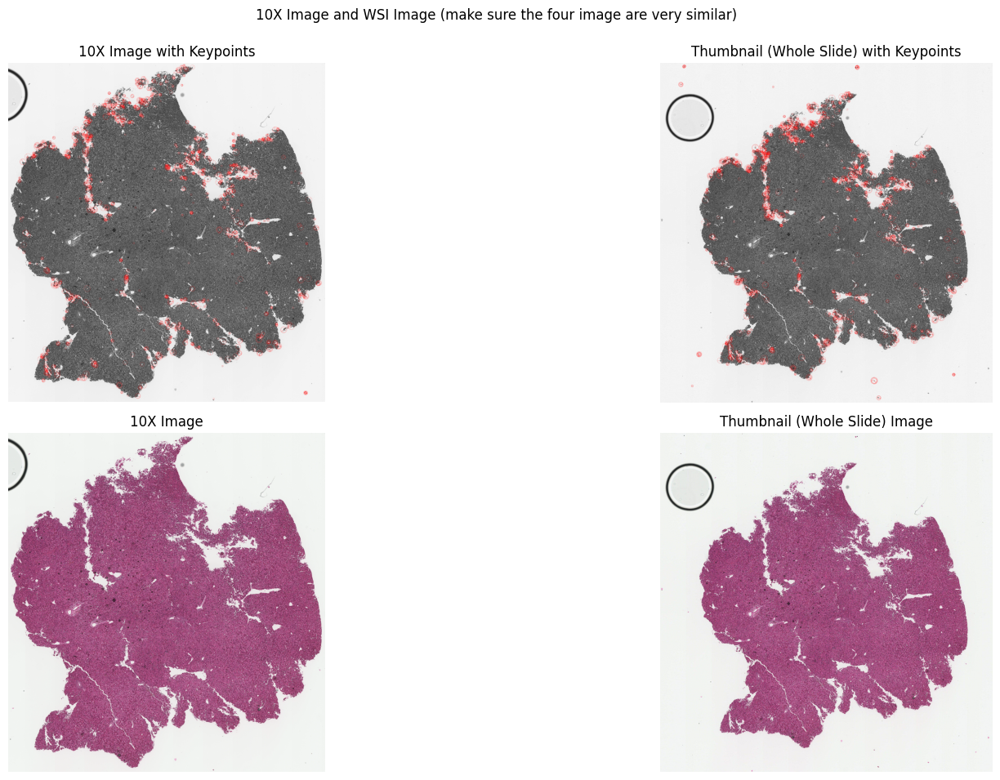

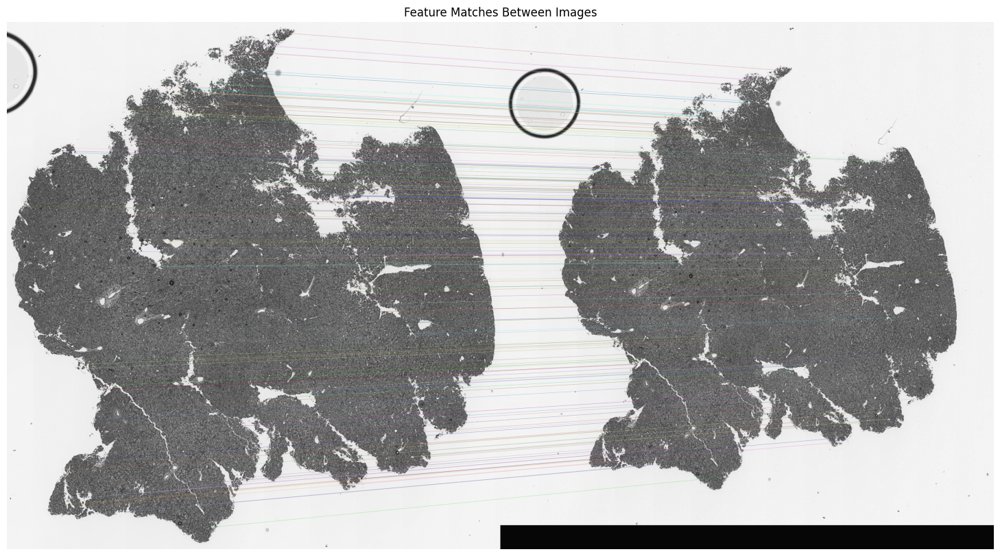

Homography matrix:
[[ 1.21542882e+00  1.46861919e-04 -7.58122535e+02]
 [-1.13797352e-04  1.21582534e+00 -5.47130399e+02]
 [-6.19709445e-08  6.21839777e-08  1.00000000e+00]]


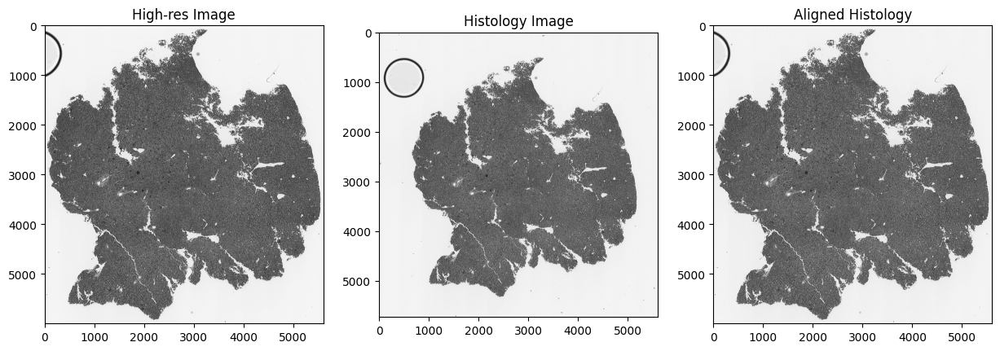

In [7]:
premaping = cp_map_wsi.PreprocessAdataImage(adata, slide_f)


In [8]:
premaping.homography_matrix

array([[ 1.21542882e+00,  1.46861919e-04, -7.58122535e+02],
       [-1.13797352e-04,  1.21582534e+00, -5.47130399e+02],
       [-6.19709445e-08,  6.21839777e-08,  1.00000000e+00]])

In [9]:



wsi_folder = Path('/pub/boyaz14/elvin_visium_hd/Capabarab_hd/data/wsi_scan')
cellranger_folder = Path('/dfs9/stanlewn-lab/share/Elvin_Tapestri/Visium_HD/WagenblastHD2/bings.mssm.edu/bings_mssm_edu/bings_omics/published_data/poddan01/external/elvin_wagenblast/WagenblastHD/WagenblastHD2/cellranger_output/ELWA02_FL3_0_v1')

slide_f, adata_folder = wsi_folder/'FL3.svs', cellranger_folder
process_tile = cp_process_wsi.ProcessTile(
    slide_f=slide_f,
    model_path=root_path/'data'/'v2_all_samples',
    # model_name=,
    tiles_folder=root_path/'data'/'FL3_analysis'/'FL3_tiles'

)

process_tile.auto()

Generating tiles
    Saving tiles to /dfs6/pub/boyaz14/elvin_visium_hd/Capabarab_hd/data/FL3_analysis/FL3_tiles


  0%|          | 0/2652 [00:00<?, ?it/s]

    Generating tiles for row: 0 (total rows: 51)
    Generating tiles for row: 1 (total rows: 51)
    Generating tiles for row: 2 (total rows: 51)
    Generating tiles for row: 3 (total rows: 51)
    Generating tiles for row: 4 (total rows: 51)
    Generating tiles for row: 5 (total rows: 51)
    Generating tiles for row: 6 (total rows: 51)
    Generating tiles for row: 7 (total rows: 51)
    Generating tiles for row: 8 (total rows: 51)
    Generating tiles for row: 9 (total rows: 51)
    Generating tiles for row: 10 (total rows: 51)
    Generating tiles for row: 11 (total rows: 51)
    Generating tiles for row: 12 (total rows: 51)
    Generating tiles for row: 13 (total rows: 51)
    Generating tiles for row: 14 (total rows: 51)
    Generating tiles for row: 15 (total rows: 51)
    Generating tiles for row: 16 (total rows: 51)
    Generating tiles for row: 17 (total rows: 51)
    Generating tiles for row: 18 (total rows: 51)
    Generating tiles for row: 19 (total rows: 51)
    Genera

2025-07-27 14:31:02.931125: E external/local_xla/xla/stream_executor/cuda/cuda_platform.cc:51] failed call to cuInit: INTERNAL: CUDA error: Failed call to cuInit: UNKNOWN ERROR (303)


Loading network weights from 'weights_best.h5'.
Loading thresholds from 'thresholds.json'.
Using default values: prob_thresh=0.458165, nms_thresh=0.3.


In [10]:
analyze_folder = process_tile.analyze_folder

boundary_predictions_folder = analyze_folder / 'nucleus_predictions'
tiles_folder = process_tile.tiles_folder





In [11]:
tile_folder = [folder for folder in Path(analyze_folder).iterdir() if 'tiles' in folder.name][0]
slide = openslide.OpenSlide(str(slide_f))


In [12]:
%load_ext autoreload
%autoreload 2
from CapybaraHD.map.map_wsi import *

map_boundary_to_adata = map_cell_boundary_from_ultra_high_res_histology_to_adata(
    analyze_folder=analyze_folder,
    slide=slide,
    tile_folder=tile_folder
    # slide_thumbnail=slide_thumbnail,
)

X min: 3072, X max: 23552,Y min: 2048,Y max: 24064
X min: 3072, X max: 23552,Y min: 2048,Y max: 24064


In [13]:
map_boundary_to_adata.one_example_tile_boundary_with_tile(idx=10)

(PosixPath('/dfs6/pub/boyaz14/elvin_visium_hd/Capabarab_hd/data/FL3_analysis/nucleus_predictions/tile_10240_15360_coords.npy'),
 PosixPath('/dfs6/pub/boyaz14/elvin_visium_hd/Capabarab_hd/data/FL3_analysis/FL3_tiles/tile_10240_15360.png'))

In [15]:
adata

AnnData object with n_obs × n_vars = 4638180 × 18085
    obs: 'in_tissue', 'array_row', 'array_col', 'spatial_sample_id'
    var: 'gene_ids', 'feature_types', 'genome'
    uns: 'spatial'
    obsm: 'spatial'

map_wsi.py (459): Trying to modify attribute `.obs` of view, initializing view as actual.
anndata.py (1758): Variable names are not unique. To make them unique, call `.var_names_make_unique`.


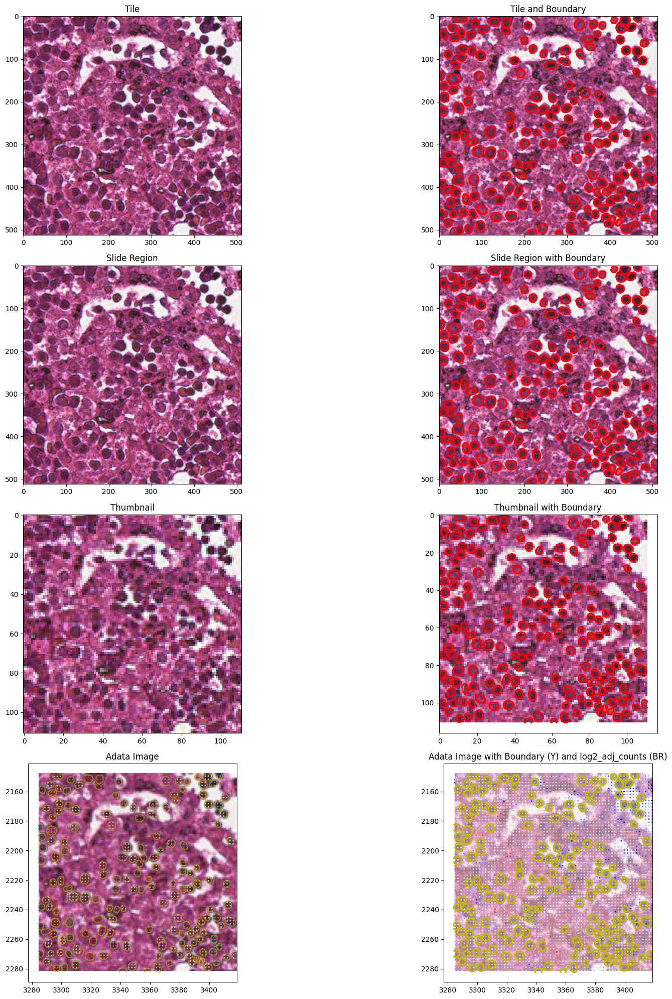

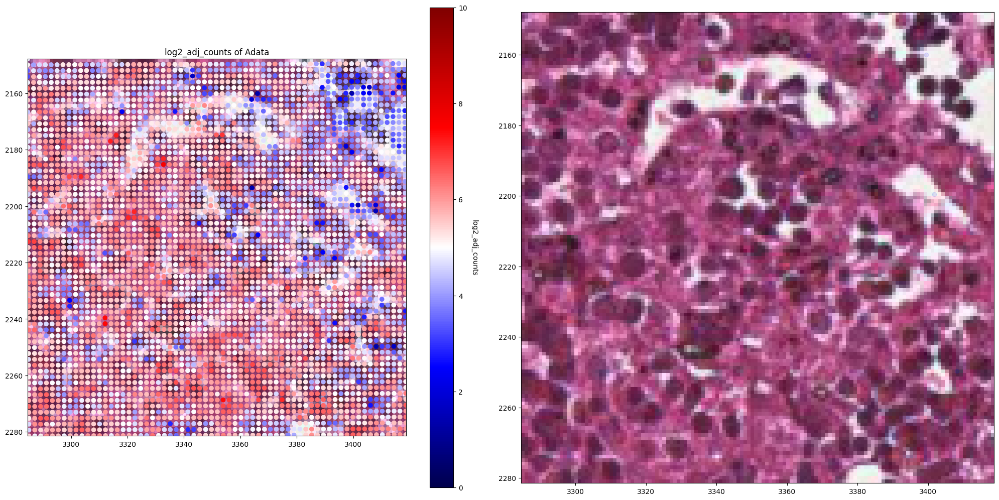

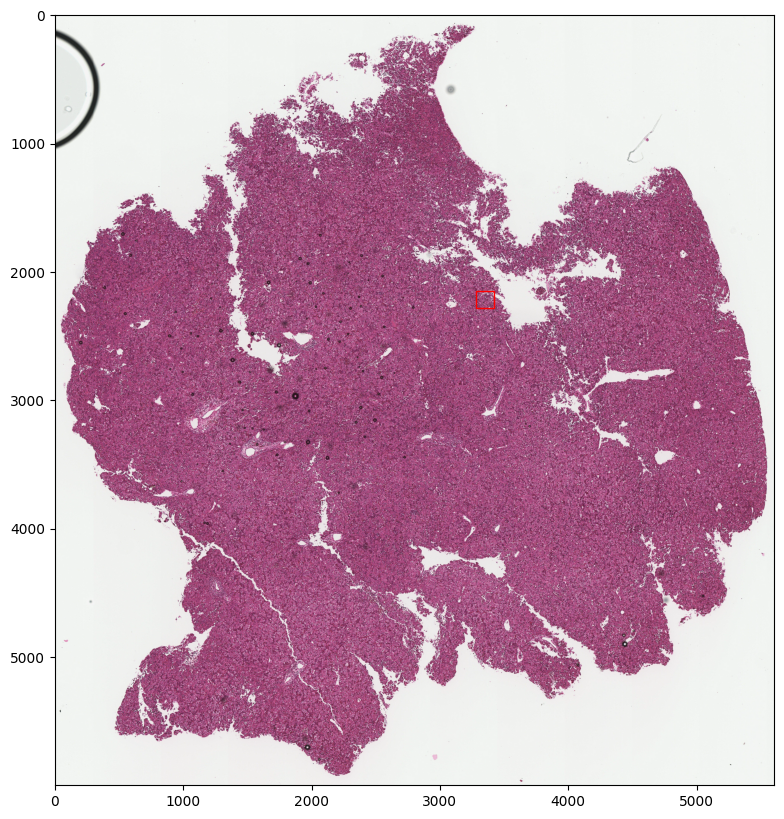

[array([[3329.33235688, 2273.50938241],
        [3329.06916756, 2273.50937655],
        [3328.80597825, 2273.50937068],
        [3328.54278895, 2273.50936482],
        [3328.27959965, 2273.50935895],
        [3328.01641036, 2273.50935308],
        [3327.75322108, 2273.50934722],
        [3327.4900318 , 2273.50934135],
        [3327.35844367, 2273.37774387],
        [3327.22685553, 2273.24614638],
        [3326.96366627, 2273.24614052],
        [3326.70047701, 2273.24613466],
        [3326.56888888, 2273.11453717],
        [3326.43730075, 2272.98293969],
        [3326.30571261, 2272.85134221],
        [3326.17412448, 2272.71974473],
        [3326.04253635, 2272.58814725],
        [3325.91094822, 2272.45654976],
        [3325.77936009, 2272.32495228],
        [3325.77937307, 2272.06176317],
        [3325.64778493, 2271.93016568],
        [3325.5161968 , 2271.7985682 ],
        [3325.51620977, 2271.53537907],
        [3325.38462164, 2271.40378159],
        [3325.2530335 , 2271.2721841 ],


In [18]:


transfered_coords = map_cell_boundary_from_ultra_high_res_histology_to_adata.transfer_high_res_boundary_to_adata_obs_cell_bounds(

    *map_boundary_to_adata.one_example_tile_boundary_with_tile(idx=10),
    slide=premaping.slide,
    slide_thumbnail=premaping.slide_thumbnail,
    adata=adata,
    adata_image=premaping.adata_image,
    homoglaphy_matrix=premaping.homography_matrix,
    new_obs_cell_bounds_variable_name='cell_boundaries',
    default_cell_bounds='Not detected',
    # verbose=True,
    # return_adata_subset=True, 

)